In [1]:
!pip install mlxtend==0.19.0 &> /dev/null
!pip install xgboost==1.2.1 &> /dev/null
!pip install lightgbm==3.2.1 &> /dev/null
!pip install sklearn-genetic-opt &> /dev/null

# 1. Import Libraries

In [2]:
# Ignore  the warnings  "error", "ignore", "always", "default", "module" or "once"
import warnings
warnings.filterwarnings('ignore')

import io
import os
from os import path

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import tensorflow as tf

import numpy as np
np.random.seed(1)
tf.random.set_seed(2)

%matplotlib inline

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FormatStrFormatter, AutoMinorLocator
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import matplotlib.mlab as mlab
import matplotlib.gridspec as gridspec
import seaborn as sns
import seaborn as sns
#from adjustText import adjust_text

import sklearn
import xgboost
import lightgbm


from sklearn.base import TransformerMixin, BaseEstimator, clone
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, OPTICS, AffinityPropagation, MeanShift, estimate_bandwidth, Birch
from sklearn.metrics import silhouette_score
from sklearn.mixture import GaussianMixture
from sklearn.pipeline import Pipeline, make_pipeline, FeatureUnion
from sklearn.feature_selection import chi2, mutual_info_classif, mutual_info_regression, SelectKBest, RFE, RFECV, SelectFromModel
from sklearn.inspection import permutation_importance

from sklearn.model_selection import cross_validate, cross_val_score, RandomizedSearchCV, GridSearchCV 
from sklearn.model_selection import KFold, StratifiedKFold, GroupKFold, LeaveOneGroupOut, LeavePGroupsOut
from sklearn import metrics
from sklearn.metrics import classification_report, accuracy_score, f1_score, confusion_matrix, precision_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score, mean_absolute_percentage_error

from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, SGDRegressor, LassoCV, ElasticNet, BayesianRidge
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR, SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost.sklearn import XGBRegressor
#from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import StackingRegressor
from lightgbm import LGBMClassifier

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
#from xgboost import XGBClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import VotingClassifier
from lightgbm import LGBMRegressor

from sklearn.neighbors import LocalOutlierFactor
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest

from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from mlxtend.regressor import StackingCVRegressor
from mlxtend.classifier import StackingCVClassifier

# explicitly require this experimental feature
from sklearn.experimental import enable_halving_search_cv  # noqa
# now you can import normally from model_selection
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.model_selection import HalvingRandomSearchCV

from sklearn_genetic import GASearchCV
from sklearn_genetic import GAFeatureSelectionCV
from sklearn_genetic.space import Integer, Categorical, Continuous
from sklearn_genetic.plots import plot_fitness_evolution, plot_search_space
from sklearn_genetic.callbacks import LogbookSaver, ProgressBar

from tensorflow import keras
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, InputLayer, Dense, Activation, Conv1D, MaxPooling1D, Flatten, BatchNormalization
from tensorflow.keras.layers import Embedding, LSTM, TimeDistributed, Dropout, concatenate, Lambda
from tensorflow.keras.regularizers import l2
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

from datetime import datetime 
from pickle import dump
from pickle import load
import statsmodels.api as sm

warnings.filterwarnings('ignore')

print('The statsmodels version is {}.'.format(sm.__version__))
print('The numpy version is {}.'.format(np.__version__))
print('The pandas version is {}.'.format(pd.__version__))
print('The scikit-learn version is {}.'.format(sklearn.__version__))
print('The xgboost version is {}.'.format(xgboost.__version__))
print('The lightgbm version is {}.'.format(lightgbm.__version__))
print('The tensorflow version is {}.'.format(tf.__version__))

The statsmodels version is 0.12.2.
The numpy version is 1.20.1.
The pandas version is 1.3.4.
The scikit-learn version is 0.24.1.
The xgboost version is 1.2.1.
The lightgbm version is 3.2.1.
The tensorflow version is 1.12.0.


# 2. Import Data

In [4]:
# Show all columns
pd.set_option('display.max_columns', None)

# Read data spreadsheet
df = pd.read_csv('housing_1.csv', low_memory=False)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,None,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,Gas

# 3. Exploratory Data Analysis

In [5]:
# Show all rows
pd.set_option('display.max_rows', None)

# Count missing values
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [6]:
# Removing Based on Number of Missing Values (drop columns if more than 33% is missing)
df = df.drop(['Alley' , 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'], axis = 1)

In [7]:
# Print variable typws
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object
HeatingQC         object


In [8]:
# Descriptive statistics for numerical variables
pd.set_option('display.float_format', lambda x: '%.1f' % x)
df.select_dtypes('number').describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.0,1460.0,1201.0,1460.0,1460.0,1460.0,1460.0,1460.0,1452.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1379.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0
mean,730.5,56.9,70.0,10516.8,6.1,5.6,1971.3,1984.9,103.7,443.6,46.5,567.2,1057.4,1162.6,347.0,5.8,1515.5,0.4,0.1,1.6,0.4,2.9,1.0,6.5,0.6,1978.5,1.8,473.0,94.2,46.7,22.0,3.4,15.1,2.8,43.5,6.3,2007.8,180921.2
std,421.6,42.3,24.3,9981.3,1.4,1.1,30.2,20.6,181.1,456.1,161.3,441.9,438.7,386.6,436.5,48.6,525.5,0.5,0.2,0.6,0.5,0.8,0.2,1.6,0.6,24.7,0.7,213.8,125.3,66.3,61.1,29.3,55.8,40.2,496.1,2.7,1.3,79442.5
min,1.0,20.0,21.0,1300.0,1.0,1.0,1872.0,1950.0,0.0,0.0,0.0,0.0,0.0,334.0,0.0,0.0,334.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,34900.0
25%,365.8,20.0,59.0,7553.5,5.0,5.0,1954.0,1967.0,0.0,0.0,0.0,223.0,795.8,882.0,0.0,0.0,1129.5,0.0,0.0,1.0,0.0,2.0,1.0,5.0,0.0,1961.0,1.0,334.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,129975.0
50%,730.5,50.0,69.0,9478.5,6.0,5.0,1973.0,1994.0,0.0,383.5,0.0,477.5,991.5,1087.0,0.0,0.0,1464.0,0.0,0.0,2.0,0.0,3.0,1.0,6.0,1.0,1980.0,2.0,480.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,163000.0
75%,1095.2,70.0,80.0,11601.5,7.0,6.0,2000.0,2004.0,166.0,712.2,0.0,808.0,1298.2,1391.2,728.0,0.0,1776.8,1.0,0.0,2.0,1.0,3.0,1.0,7.0,1.0,2002.0,2.0,576.0,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,214000.0
max,1460.0,190.0,313.0,215245.0,10.0,9.0,2010.0,2010.0,1600.0,5644.0,1474.0,2336.0,6110.0,4692.0,2065.0,572.0,5642.0,3.0,2.0,3.0,2.0,8.0,3.0,14.0,3.0,2010.0,4.0,1418.0,857.0,547.0,552.0,508.0,480.0,738.0,15500.0,12.0,2010.0,755000.0


In [9]:
# Descriptive statistics for categorical variables
df.select_dtypes('object').describe()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1452,1460,1460,1460,1423,1423,1422,1423,1422,1460,1460,1460,1459,1460,1460,1379,1379,1379,1379,1460,1460,1460
unique,5,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,4,4,4,6,6,6,5,2,5,4,7,6,3,5,5,3,9,6
top,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,Unf,TA,TA,Y,WD,Normal
freq,1151,1454,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,864,906,1282,647,649,1311,953,430,1256,1428,741,1365,1334,735,1360,870,605,1311,1326,1340,1267,1198


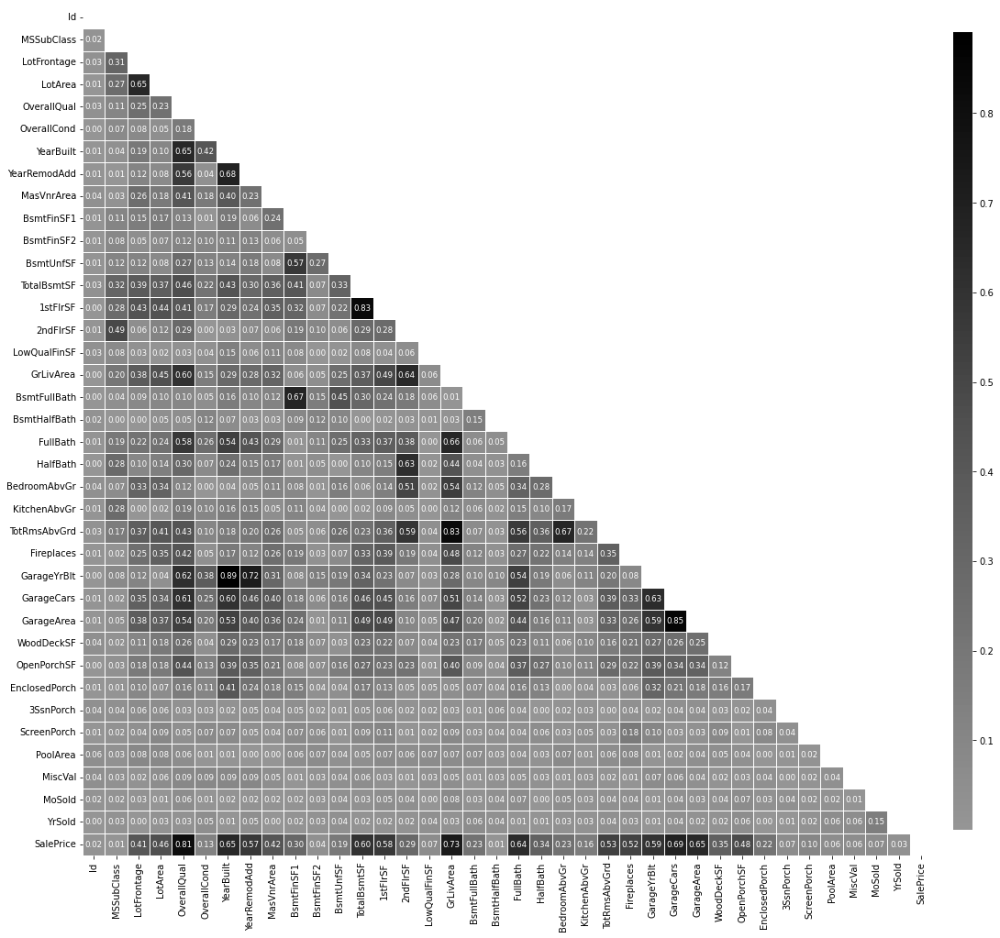

In [10]:
# Plot Spearman's Rank-Order correlation matrix
correlation = df.corr(method='spearman').abs()
mask = np.zeros_like(correlation, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(correlation, mask=mask, center=0, annot=True, cmap="Greys", fmt='.2f',
            square=True, linewidths=.5, cbar_kws={"shrink": .8, 'aspect': 40, 'pad': 0.02},
            annot_kws={"size": 53 / np.sqrt(len(correlation))})
plt.show()

# 4. Data Preprocessing

In [11]:
### One-hot Encode categorical features
pd.reset_option('max_rows')
df_new = pd.get_dummies(df, prefix_sep="_")
df_new

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,GarageType_2Types,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_Fin,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Ex,GarageQual_Fa,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Ex,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedD

In [12]:
# Specify features and target
X = df_new.drop(['SalePrice'], axis=1).fillna(0)
y = df_new['SalePrice']
# Create train, validation, and test splits
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.1, random_state=42)

# X_train, X_val, y_train, y_val = train_test_split(
#     X_train, y_train, test_size=0.111, random_state=101) # 0.111 x 0.9 = 0.1

print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
# print("X_val shape:", X_val.shape)
# print("y_val shape:", y_val.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (1314, 271)
y_train shape: (1314,)
X_test shape: (146, 271)
y_test shape: (146,)


# 5. Feature Selection

In [13]:
# Define the regression model and GAFeatureSelectionCV options
lgbm = LGBMRegressor(booster='gbdt', objective ='regression', random_state=33)

feature_selector = GAFeatureSelectionCV(
    estimator=lgbm,
    cv=3,
    scoring="neg_mean_absolute_percentage_error",
    population_size=30,
    generations=40,
    n_jobs=-1,
    verbose=True,
    keep_top_k=2,
    elitism=True,
)

In [14]:
# Evaluation set for early stopping of LGBM algorithm
from sklearn_genetic.callbacks import ProgressBar, DeltaThreshold

progress_callback = ProgressBar()
performance_callback = DeltaThreshold(threshold=0.001, generations=5, metric='fitness_min')
# eval_set = [(X_val, y_val)]
feature_selector.fit(X_train, y_train, callbacks=[progress_callback, performance_callback])

  0%|          | 0/41 [00:00<?, ?it/s]

gen	nevals	fitness  	fitness_std	fitness_max	fitness_min
0  	30    	-0.114466	0.00598871 	-0.103935  	-0.127478  
1  	60    	-0.110252	0.00264911 	-0.10622   	-0.114934  
2  	60    	-0.107921	0.00218285 	-0.104708  	-0.111634  
3  	60    	-0.105274	0.00231892 	-0.100104  	-0.110009  
4  	60    	-0.103876	0.00216681 	-0.0999798 	-0.106865  
5  	60    	-0.10129 	0.00178359 	-0.0996806 	-0.106022  
6  	60    	-0.0998875	0.000457178	-0.0987386 	-0.100457  
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [War

GAFeatureSelectionCV(estimator=LGBMRegressor(booster='gbdt',
                                             objective='regression',
                                             random_state=33),
                     generations=40, keep_top_k=2, n_jobs=-1,
                     population_size=30, return_train_score=True,
                     scoring='neg_mean_absolute_percentage_error')

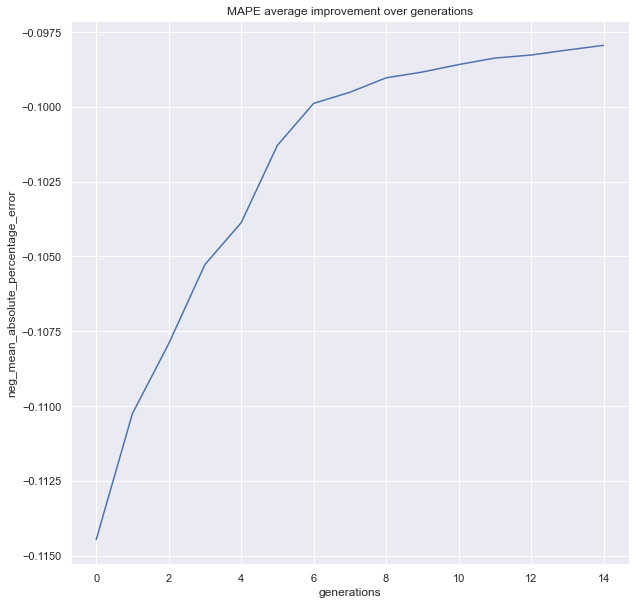

In [15]:
plot = plot_fitness_evolution(feature_selector, metric="fitness")
plt.ylabel("neg_mean_absolute_percentage_error");
plt.title("MAPE average improvement over generations")
plt.show()

In [16]:
features = X.columns.to_numpy()
selected_features = features[feature_selector.best_features_]
print(selected_features)

['LotArea' 'OverallQual' 'OverallCond' 'YearBuilt' 'YearRemodAdd'
 'BsmtFinSF1' 'BsmtFinSF2' 'BsmtUnfSF' 'TotalBsmtSF' '1stFlrSF' '2ndFlrSF'
 'LowQualFinSF' 'GrLivArea' 'BsmtFullBath' 'FullBath' 'KitchenAbvGr'
 'GarageCars' '3SsnPorch' 'MiscVal' 'Street_Grvl' 'Street_Pave'
 'LotShape_IR2' 'LotShape_Reg' 'LandContour_HLS' 'LandContour_Lvl'
 'LotConfig_CulDSac' 'LotConfig_FR3' 'Neighborhood_Blmngtn'
 'Neighborhood_Blueste' 'Neighborhood_BrDale' 'Neighborhood_Crawfor'
 'Neighborhood_Gilbert' 'Neighborhood_Mitchel' 'Neighborhood_NPkVill'
 'Neighborhood_NWAmes' 'Neighborhood_NoRidge' 'Neighborhood_NridgHt'
 'Neighborhood_OldTown' 'Neighborhood_SawyerW' 'Neighborhood_StoneBr'
 'Condition1_Artery' 'Condition1_Feedr' 'Condition1_PosA'
 'Condition1_RRNn' 'Condition2_Artery' 'Condition2_PosN' 'Condition2_RRAn'
 'Condition2_RRNn' 'BldgType_1Fam' 'BldgType_Duplex' 'BldgType_TwnhsE'
 'HouseStyle_1.5Fin' 'HouseStyle_1.5Unf' 'HouseStyle_2.5Fin'
 'HouseStyle_2.5Unf' 'HouseStyle_SFoyer' 'RoofStyle_Gamb

In [17]:
# Select subset of features for hyperparameter tuning
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

print("X_train_selected shape:", X_train_selected.shape)
print("X_test_selected shape:", X_test_selected.shape)

X_train_selected shape: (1314, 140)
X_test_selected shape: (146, 140)


# 6. Hyperparameter Tuning

In [18]:
#%%time

# Define hyperparameter options
boosting_type = ['gbdt', 'dart', 'rf']
num_leaves = [11, 21, 31, 51]
max_depth = [-1, 1, 3, 7, 11, 15]
learning_rate = [0.01, 0.1, 1]
n_estimators = [100, 300, 600, 1000]
reg_lambda = [0, 0.0001, 0.001, 0.01, 0.1]
min_child_samples = [5, 10, 20, 30, 50]
subsample = [0.6, 0.8, 1.0] 
subsample_freq = [1, 5] 
colsample_bytree = [0.66, 0.8, 1.0]

hyperparameters = dict(boosting_type=boosting_type, num_leaves=num_leaves,
                       max_depth=max_depth, learning_rate=learning_rate,
                       n_estimators=n_estimators, reg_lambda=reg_lambda,
                       min_child_samples=min_child_samples, subsample=subsample,
                       subsample_freq=subsample_freq, colsample_bytree=colsample_bytree)

lgbm = LGBMRegressor(booster='gbdt', objective ='regression', random_state=33)

kf = KFold(n_splits=3, shuffle=True, random_state=33)

clf1 = RandomizedSearchCV(estimator=lgbm, 
                          param_distributions=hyperparameters,
                          n_iter=5000,
                          cv=kf,
                          scoring='neg_mean_absolute_percentage_error',
                          verbose=100,
                          refit=True,
                          random_state=33,
                          n_jobs=-1)

clf1.fit(X_train_selected, y_train)
print('Best parameters (min. MAPE): ', clf1.best_params_)
print('Best score (MAPE): ', clf1.best_score_)

Fitting 3 folds for each of 5000 candidates, totalling 15000 fits

[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter:

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter: booster
[LightGBM] [Warning] Unknown parameter:

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 7/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 7/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 1/3; 8/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 8/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.9s
[CV 1/3; 9/5000] START boosting_type=gbdt, colsample_bytree=0.8

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 10/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 10/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 11/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[CV 2/3; 11/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 2/3; 12/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_sa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 5/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 3/3; 5/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 5/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 6/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 6/5000]

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 30/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 1/3; 32/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 32/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   1.3s
[CV 2/3; 34/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 30/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 1/3; 31/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 31/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 3/3; 31/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 31/5000] END boosting_type=gbdt, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 58/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 58/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 58/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 1/3; 59/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 42/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.8s
[CV 2/3; 46/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 46/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 3/3; 47/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 47/5000] END boosting_type=rf, colsample_bytree=0.8, le

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 79/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[CV 2/3; 79/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 79/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[CV 3/3; 79/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 80/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=300, num_leaves=21, reg

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 1/3; 78/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 78/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   2.9s
[CV 2/3; 80/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 80/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.7s
[CV 1/3; 81/5000] START boosting_type=rf, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 98/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   5.5s
[CV 3/3; 99/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 99/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   5.9s
[CV 1/3; 101/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 101/5000]

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 125/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 125/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 125/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 1/3; 126/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 126/50

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 106/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.9s
[CV 3/3; 107/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 107/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=  10.2s
[CV 2/3; 111/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 141/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 141/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   4.3s
[CV 3/3; 143/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 143/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   3.0s
[CV 3/3; 147/5000] START boosting_type=gbdt, colsample_bytree

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 138/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 138/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 3/3; 139/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 139/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   1.1s
[CV 2/3; 141/5000] START boosting_type=da

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 155/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   3.0s
[CV 2/3; 156/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 156/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=  11.6s
[CV 3/3; 158/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 158/5000] END boosting_type=dart, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 187/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 187/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 2/3; 187/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 187/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 3/3; 187/5000] START boosting_type=rf, colsample_bytree

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 204/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   4.1s
[CV 1/3; 205/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 205/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.8s
[CV 2/3; 205/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 185/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   4.8s
[CV 1/3; 191/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 191/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.6s
[CV 1/3; 192/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 206/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   6.9s
[CV 2/3; 213/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 213/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.4s
[CV 2/3; 216/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 217/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 218/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 218/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 2/3; 219/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 250/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 250/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.6s
[CV 3/3; 251/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 251/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.8s
[CV 3/3; 255/5000] START boosting_type=dart, colsam

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 247/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.8s
[CV 1/3; 248/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 248/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 2/3; 249/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 261/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 261/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.9s
[CV 1/3; 263/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 263/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 263/5000] START boosting_type=rf, colsample_bytree=0.6

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 271/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 271/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 3/3; 271/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 271/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 2/3; 272/5000] START boosting_type=dart, colsam

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 263/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 1/3; 264/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 264/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 264/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[CV 2/3; 264/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_sampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 262/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 262/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.3s
[CV 1/3; 267/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 267/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   3.1s
[CV 2/3; 271/5000] START boosting_type=gbdt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 298/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 3/3; 300/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 300/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 302/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 310/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 1/3; 311/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 311/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 311/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[CV 2/3; 311/5000] END boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 340/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 341/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 341/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   1.6s
[CV 2/3; 342/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 362/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 362/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 362/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 362/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 362/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 339/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 339/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 340/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 340/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 2/3; 341/5000] START boosting_type=dart, co

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 348/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 348/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 1/3; 349/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 349/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.7s
[CV 1/3; 351/5000] START boosting_type=dart, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 370/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.2s
[CV 3/3; 372/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 372/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.6s
[CV 2/3; 375/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 416/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 416/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 416/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 416/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 1/3; 417/5000] START boosting_type=gbdt, colsample_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 430/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 430/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 430/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 430/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 430/50

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 2/3; 419/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 419/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   1.4s
[CV 1/3; 422/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 422/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 422/5000] START boosting_type=gbdt, colsample_bytr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 449/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 449/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   2.0s
[CV 2/3; 450/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 450/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 451/5000] START boosting_type=gbdt, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 473/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 474/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 474/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.8s
[CV 1/3; 476/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 455/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   1.3s
[CV 3/3; 456/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 456/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   1.8s
[CV 1/3; 459/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 491/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=  17.6s
[CV 3/3; 497/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 497/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.7s
[CV 1/3; 499/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 499/5000] END boosting_type=dart, colsample_by

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 481/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 481/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 1/3; 483/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 483/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 483/5000] START boosting_type=gbdt, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 499/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 499/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.7s
[CV 2/3; 502/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 502/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.9s
[CV 3/3; 504/5000] START boosting_type=dart, colsample_bytr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 520/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   8.9s
[CV 1/3; 522/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 522/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   5.5s
[CV 2/3; 529/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 517/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 517/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   6.5s
[CV 3/3; 520/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 520/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   9.1s
[CV 1/3; 523/5000] START boosting_type=gbdt, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 534/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 534/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 2/3; 534/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 534/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 534/5000] START boosting_type=rf, colsample_bytree

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 2/3; 546/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 1/3; 547/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 547/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 547/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 547/5000] END boosting_type=gbdt, colsample_bytree=0.8

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 540/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 540/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   3.5s
[CV 1/3; 542/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 542/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 3/3; 542/5000] START boosting_type=dart, colsample_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 586/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 586/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 586/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 586/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 586/5000] START boosting_type=rf, colsample_bytree=0.8, learning_r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 610/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 610/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 610/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 610/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 3/3; 611/5000] START boosting_type=gbdt, colsample_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 605/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 3/3; 605/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 605/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 3/3; 606/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 606/5000] END boosting_type=gbdt, cols

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 625/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 626/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 626/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 626/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 655/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 2/3; 655/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 655/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 655/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 658/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 658/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=  11.0s
[CV 2/3; 661/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 661/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   3.7s
[CV 1/3; 662/5000] START boosting_type=dart, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 651/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   8.6s
[CV 1/3; 658/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 658/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=  10.7s
[CV 3/3; 660/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 660/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 660/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   7.7s
[CV 3/3; 662/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 662/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   1.2s
[CV 1/3; 664/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 664/5000] END boosting_type=dart, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 701/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 701/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 2/3; 701/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 701/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 3/3; 702/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rat

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 3/3; 705/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 705/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   1.3s
[CV 1/3; 707/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 707/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 707/5000] START boosting_type=rf, colsam

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 715/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.8s
[CV 2/3; 715/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 715/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.8s
[CV 1/3; 716/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 745/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.5s
[CV 2/3; 747/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 747/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 748/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 74

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 762/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   8.2s
[CV 1/3; 766/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 766/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 2/3; 767/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 779/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 779/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   1.2s
[CV 2/3; 780/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 780/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   2.5s
[CV 2/3; 782/5000] START boosting_type=rf, colsam

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 775/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 1/3; 778/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 778/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.9s
[CV 2/3; 778/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 823/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 3/3; 823/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 824/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[CV 1/3; 824/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 824/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leav

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 815/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 815/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 815/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 815/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 816/5000] START boosting_type=gbdt, colsample_bytr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 841/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.5s
[CV 3/3; 842/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 842/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 2/3; 844/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 844/50

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 849/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 849/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 1/3; 850/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 850/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.8s
[CV 3/3; 852/5000] START boosting_type=rf, colsample_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 887/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 3/3; 887/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[CV 3/3; 887/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 3/3; 888/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[CV 3/3; 888/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_s

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 872/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 872/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 3/3; 873/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 873/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   5.9s
[CV 1/3; 878/5000] START boosting_type=rf, colsample_bytree

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 895/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 2/3; 895/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 895/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 3/3; 895/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 884/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 885/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[CV 1/3; 885/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 2/3; 885/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 885/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 923/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 924/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[CV 1/3; 924/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 2/3; 924/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 924/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_sampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 918/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 918/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 2/3; 918/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 918/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 918/5000] START boosting_type=gbdt, colsam

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 953/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 954/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 954/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   3.2s
[CV 2/3; 956/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 940/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 940/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 940/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 1/3; 941/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 1/3; 956/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 956/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 3/3; 956/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 956/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 2/3; 957/5000] START boosting_type=gbdt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 986/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.4s
[CV 1/3; 987/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 987/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 987/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 987/5000] END boosting_type=gbdt, colsample_bytree=0.66, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 2/3; 998/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 998/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 2/3; 999/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 999/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 1000/5000] START boosting_type=dart, colsample_bytree=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 3/3; 1018/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1018/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 2/3; 1019/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1019/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   1.4s
[CV 3/3; 1020/5000] START boosting_type=dart, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 1035/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1035/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 1035/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1035/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 3/3; 1035/5000] START boosting_type=rf, colsample_bytree=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 1007/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1007/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 1/3; 1008/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1008/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 2/3; 1008/5000] START boosting_type=gbdt, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 3/3; 1046/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1046/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.6s
[CV 1/3; 1047/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1047/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 1047/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 1062/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1062/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   2.8s
[CV 2/3; 1064/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1064/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 3/3; 1066/5000] START boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1073/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 2/3; 1073/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1073/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 3/3; 1073/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 1084/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1084/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   4.1s
[CV 3/3; 1084/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1084/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   2.7s
[CV 1/3; 1088/5000] START boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 1094/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1094/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   1.2s
[CV 1/3; 1096/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1096/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 1096/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 1090/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1090/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 3/3; 1091/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1091/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 1/3; 1093/5000] START boosting_type=dart, colsample_byt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 1116/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1116/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.3s
[CV 3/3; 1119/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1119/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   3.4s
[CV 2/3; 1121/5000] START boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 1120/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1120/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   3.2s
[CV 2/3; 1120/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1120/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   3.1s
[CV 3/3; 1122/5000] START boosting_type=dart, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1130/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.3s
[CV 3/3; 1130/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1130/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.2s
[CV 1/3; 1131/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: bo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 1139/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 1139/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 3/3; 1139/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 1140/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[CV 1/3; 1140/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 3/3; 1152/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1152/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   3.8s
[CV 1/3; 1155/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1155/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.2s
[CV 2/3; 1155/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 1157/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1157/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 1158/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1158/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   9.8s
[CV 2/3; 1164/5000] START boosting_type=dart, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 1194/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1194/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 1194/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1194/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 3/3; 1194/5000] START boosting_type=gbdt, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1185/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 1/3; 1188/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1188/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 2/3; 1189/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 1/3; 1211/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   6.0s
[CV 3/3; 1216/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1216/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   9.2s
[CV 3/3; 1224/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1224/5000] END boosting_type=gbdt, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1229/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 2/3; 1229/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1229/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 3/3; 1229/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 12

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 1248/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1248/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   3.1s
[CV 3/3; 1248/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1248/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   3.8s
[CV 3/3; 1253/5000] START boosting_type=rf, colsample_bytree=1.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1264/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   1.2s
[CV 3/3; 1265/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1265/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.8s
[CV 1/3; 1268/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 1244/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1244/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.7s
[CV 1/3; 1246/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1246/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   7.3s
[CV 2/3; 1248/5000] START boosting_type=g

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1258/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   1.6s
[CV 3/3; 1260/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1260/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.8s
[CV 2/3; 1263/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1297/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.7s
[CV 1/3; 1298/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1298/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 1298/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[CV 2/3; 1298/5000] END boosting_type=rf, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 1293/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1293/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 1/3; 1294/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1294/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 1294/5000] START boosting_type=rf, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 1329/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1329/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 1/3; 1331/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1331/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 1331/5000] START boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 1354/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 3/3; 1354/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1354/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 1355/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1355/5000] END boosting_type=gbdt, colsample_bytree=1.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1343/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 3/3; 1343/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1343/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 1/3; 1344/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 1/3; 1366/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1366/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   2.2s
[CV 2/3; 1368/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1368/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   1.9s
[CV 1/3; 1372/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1366/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   2.2s
[CV 1/3; 1369/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1369/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 3/3; 1369/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1395/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   2.0s
[CV 1/3; 1399/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1399/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   1.2s
[CV 2/3; 1400/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: bo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 1419/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1419/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   1.6s
[CV 1/3; 1421/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1421/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.8s
[CV 3/3; 1424/5000] START boosting_type=g

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 1391/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1391/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   2.3s
[CV 3/3; 1392/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1392/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 1393/5000] START boosting_type=dart, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1444/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 3/3; 1445/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1445/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 1446/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[CV 3/3; 1446/5000] END boosting_type=rf, colsample_by

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 1464/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1464/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.4s
[CV 1/3; 1465/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1465/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 1465/5000] START boosting_type=dart, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 1506/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1506/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 1/3; 1508/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1508/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 1508/5000] START boosting_type=rf, colsample_bytree=1.0,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 1493/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1493/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 2/3; 1493/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1493/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 1494/5000] START boosting_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1518/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.4s
[CV 1/3; 1519/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1519/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 2/3; 1519/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1519/5000

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1517/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   7.1s
[CV 1/3; 1524/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1524/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   1.7s
[CV 2/3; 1525/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 1562/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1562/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   5.1s
[CV 1/3; 1565/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1565/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 1565/5000] START boosting_type=dart, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 1586/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1586/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   1.2s
[CV 3/3; 1586/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1586/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   1.1s
[CV 3/3; 1587/5000] START boosting_type=dart, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 1597/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1597/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 1/3; 1599/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1599/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.5s
[CV 2/3; 1599/5000] START boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1582/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 3/3; 1582/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1582/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 1/3; 1583/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1605/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.9s
[CV 2/3; 1605/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1605/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.8s
[CV 3/3; 1605/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 1609/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1609/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 1/3; 1610/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1610/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 1/3; 1611/5000] START boosting_type=dar

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 1/3; 1627/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1627/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 3/3; 1627/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1627/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.5s
[CV 3/3; 1630/5000] START boosting_type=dart, colsample_bytree=1.0, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 1638/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   2.6s
[CV 2/3; 1644/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1644/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 1645/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1645/5000] END boosting_type=rf, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 1643/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1643/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 3/3; 1643/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1643/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 3/3; 1644/5000] START boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1664/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   1.6s
[CV 3/3; 1666/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1666/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   2.7s
[CV 1/3; 1671/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1662/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 1662/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 2/3; 1662/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 1662/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 3/3; 1662/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_sample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1665/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 3/3; 1665/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1665/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 2/3; 1666/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1666/50

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1686/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 1686/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1686/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 1687/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 2/3; 1679/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   5.8s
[CV 3/3; 1687/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1687/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.9s
[CV 1/3; 1689/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1689/5000] END boosting_type=dart, colsample_bytr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1710/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   6.4s
[CV 3/3; 1716/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1716/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   1.5s
[CV 1/3; 1719/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 1694/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1694/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 1695/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1695/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 1696/5000] START boosting_type=gbdt, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 1730/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1730/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   3.0s
[CV 3/3; 1730/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1730/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   2.8s
[CV 3/3; 1732/5000] START boosting_type=dart, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1763/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   1.9s
[CV 1/3; 1765/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1765/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   1.6s
[CV 2/3; 1767/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1785/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 1785/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1785/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 3/3; 1785/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1785/5000]

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1784/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=  10.6s
[CV 1/3; 1794/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1794/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 1794/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1794/500

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1753/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   1.8s
[CV 1/3; 1754/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1754/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=  15.3s
[CV 2/3; 1759/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 1771/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1771/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 1/3; 1773/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1773/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   1.0s
[CV 2/3; 1773/5000] START boosting_type=dart, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1805/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 1806/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1806/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 1/3; 1807/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1806/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 3/3; 1806/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1806/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.8s
[CV 1/3; 1812/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1823/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 1823/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 2/3; 1823/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 1823/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 3/3; 1823/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, m

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 1795/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1795/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 1796/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1796/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   1.8s
[CV 3/3; 1797/5000] START boosting_type=dart,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 1833/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1833/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 3/3; 1833/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1833/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 2/3; 1834/5000] START boosting_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1814/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 1814/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1814/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 3/3; 1814/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 18

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1875/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   3.0s
[CV 3/3; 1877/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1877/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   2.3s
[CV 3/3; 1879/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1833/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 1/3; 1834/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1834/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 1834/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 1889/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1889/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   1.0s
[CV 2/3; 1891/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1891/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 1/3; 1892/5000] START boosting_type=gbdt, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk

[CV 1/3; 1862/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1862/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 2/3; 1862/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1862/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 1862/5000] START boosting_type=gbdt, colsample_bytr

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 1872/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.6s
[CV 2/3; 1872/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1872/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.7s
[CV 3/3; 1874/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1874/5000] END boosting_type=gbdt, colsample_bytree

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1930/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 1932/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1932/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 1/3; 1933/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1919/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   2.2s
[CV 3/3; 1920/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1920/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   1.3s
[CV 3/3; 1923/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 1943/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1943/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 1/3; 1944/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1944/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 1944/5000] START boosting_type=rf, colsample_bytree=0.8, lea

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1936/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 1936/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1936/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 1937/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 1933/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1933/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   1.8s
[CV 1/3; 1937/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1937/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   6.4s
[CV 2/3; 1942/5000] START boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1949/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 1/3; 1950/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1950/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   1.2s
[CV 1/3; 1951/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 1971/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 1971/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   2.3s
[CV 2/3; 1973/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1973/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   7.9s
[CV 3/3; 1977/5000] START boosting_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 1969/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1969/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   6.0s
[CV 3/3; 1971/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 1971/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   2.5s
[CV 1/3; 1974/5000] START boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 1972/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[CV 3/3; 1972/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 1973/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[CV 1/3; 1973/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   7.7s
[CV 1/3; 1977/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1969/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   6.0s
[CV 2/3; 1971/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 1971/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   2.4s
[CV 3/3; 1973/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown paramet

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2005/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   1.1s
[CV 1/3; 2006/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2006/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 2006/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 2019/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2019/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 1/3; 2022/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2022/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.9s
[CV 3/3; 2024/5000] START boosting_type=dart,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 2023/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 2023/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2023/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 2023/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2023/5000] END boosting_type=dart, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 2045/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2045/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 1/3; 2046/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2046/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 2046/5000] START boosting_type=rf, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2041/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2041/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 3/3; 2041/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2041/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 1/3; 2042/5000] START boosting_type=rf, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2070/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   4.1s
[CV 1/3; 2072/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2072/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   4.9s
[CV 3/3; 2075/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter:

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2097/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2097/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 3/3; 2099/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2099/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 3/3; 2101/5000] START boosting_type=dart, colsample_bytree=0.8,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 2113/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 2113/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2113/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 1/3; 2114/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2114/5000] END boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 1/3; 2130/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2130/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 2130/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[CV 2/3; 2130/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 2130/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 2109/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2109/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   2.4s
[CV 1/3; 2111/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2111/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.7s
[CV 3/3; 2111/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2127/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   1.5s
[CV 2/3; 2128/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2128/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   3.1s
[CV 3/3; 2131/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2149/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 1/3; 2150/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2150/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 2150/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 2144/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[CV 2/3; 2144/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   1.1s
[CV 2/3; 2145/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2145/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 2146/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_sam

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 2133/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2133/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   2.4s
[CV 2/3; 2137/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2137/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   2.1s
[CV 3/3; 2139/5000] START boosting_type=rf, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 3/3; 2170/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2170/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.9s
[CV 3/3; 2172/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2172/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   2.7s
[CV 1/3; 2176/5000] START boosting_type=gbdt, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 2160/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   1.3s
[CV 2/3; 2160/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2160/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   1.2s
[CV 3/3; 2160/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2160/5000] END boosting_type=gbdt, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2202/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2202/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 2202/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2202/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 2203/5000] START boosting_type=gbdt, colsample_bytree=0.66

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 2191/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2191/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 2192/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2192/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   3.0s
[CV 3/3; 2194/5000] START boosting_type=gbd

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2219/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 2220/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2220/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   1.2s
[CV 1/3; 2223/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 2251/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   4.9s
[CV 1/3; 2256/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2256/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 2257/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2257/5000] END boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 2252/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2252/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.7s
[CV 1/3; 2253/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2253/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.4s
[CV 2/3; 2253/5000] START boosting_type=dart,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 2267/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 1/3; 2270/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2270/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 2270/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 2/3; 2270/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_sampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2267/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   1.0s
[CV 2/3; 2269/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2269/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.8s
[CV 3/3; 2271/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 2292/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2292/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 1/3; 2293/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2293/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 2/3; 2293/5000] START boosting_type=rf, colsample_byt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2298/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 2298/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[CV 2/3; 2298/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 2299/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[CV 2/3; 2299/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_s

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 2273/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2273/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 3/3; 2273/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2273/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 1/3; 2274/5000] START boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2328/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   4.7s
[CV 1/3; 2331/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2331/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 2331/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[CV 2/3; 2331/5000] END boosting_type=rf, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 2/3; 2364/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2364/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 2364/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2364/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 1/3; 2365/5000] START boosting_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 2382/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2382/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 2382/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2382/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 3/3; 2382/5000] START boosting_type=dar

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2357/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.5s
[CV 2/3; 2358/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2358/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   5.7s
[CV 3/3; 2365/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 2389/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2389/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.5s
[CV 1/3; 2391/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2391/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   1.2s
[CV 2/3; 2393/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2411/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2411/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 1/3; 2412/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2412/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   2.8s
[CV 1/3; 2414/5000] START boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2405/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2405/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 3/3; 2405/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2405/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 1/3; 2406/5000] START boosting_type=rf, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 2420/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2420/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 2/3; 2420/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2420/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 3/3; 2420/5000] START boosting_type=dart, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 2440/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2440/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 2441/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2441/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.7s
[CV 2/3; 2442/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 2443/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2443/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 3/3; 2444/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2444/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.2s
[CV 3/3; 2445/5000] START boosting_type=dart, colsample_byt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2431/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 2/3; 2432/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2432/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 3/3; 2433/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: boo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 2464/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2464/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   1.5s
[CV 2/3; 2465/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2465/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 1/3; 2466/5000] START boosting_type=rf, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 2470/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2470/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 3/3; 2470/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2470/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 2471/5000] START boosting_type=gbd

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 2468/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2468/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   2.1s
[CV 1/3; 2472/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2472/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   1.9s
[CV 1/3; 2474/5000] START boosting_type=rf, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 2491/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2491/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.7s
[CV 1/3; 2494/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2494/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 2494/5000] START boosting_type=gbdt, colsample_bytree=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 2525/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2525/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.9s
[CV 2/3; 2526/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2526/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   1.7s
[CV 1/3; 2527/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2506/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2506/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 1/3; 2507/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2507/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   4.5s
[CV 3/3; 2511/5000] START boosting_type=gbdt, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2540/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 1/3; 2541/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2541/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 2541/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 254

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2547/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 1/3; 2549/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2549/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.9s
[CV 3/3; 2550/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 2540/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2540/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 3/3; 2540/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2540/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.7s
[CV 2/3; 2541/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2566/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   1.1s
[CV 1/3; 2568/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2568/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 2568/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 25

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2565/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   1.1s
[CV 3/3; 2565/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2565/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   1.9s
[CV 2/3; 2567/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2583/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.3s
[CV 1/3; 2584/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2584/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.8s
[CV 1/3; 2585/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 2620/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2620/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 3/3; 2620/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2620/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.7s
[CV 1/3; 2625/5000] START boosting_type=rf, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2636/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 3/3; 2636/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2636/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 2/3; 2637/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2637/5000] END boosting_type=gbdt, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2638/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.9s
[CV 3/3; 2639/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2639/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   2.0s
[CV 1/3; 2641/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 26

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2656/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.6s
[CV 2/3; 2657/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2657/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   4.3s
[CV 1/3; 2659/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter:

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2652/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   1.8s
[CV 2/3; 2654/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2654/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 2655/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2678/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.9s
[CV 3/3; 2678/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2678/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.0s
[CV 1/3; 2681/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2659/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.2s
[CV 2/3; 2660/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2660/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 2/3; 2662/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 2698/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2698/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 2699/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2699/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 2699/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2728/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 3/3; 2728/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2728/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 1/3; 2729/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 2763/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2763/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 2763/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2763/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 1/3; 2764/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 2758/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2758/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   4.1s
[CV 2/3; 2761/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2761/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   5.6s
[CV 2/3; 2767/5000] START boosting_type=dart, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 2759/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2759/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 1/3; 2760/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2760/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 2760/5000] START boosting_type=dart, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2783/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.0s
[CV 1/3; 2784/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2784/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.6s
[CV 1/3; 2786/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2804/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.5s
[CV 3/3; 2805/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2805/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 3/3; 2807/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 2829/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2829/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 2/3; 2829/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2829/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 3/3; 2829/5000] START boosting_type=gbdt, colsample_bytree=0.8,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2776/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   2.4s
[CV 3/3; 2778/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2778/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   2.0s
[CV 3/3; 2781/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 2809/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2809/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.7s
[CV 1/3; 2811/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2811/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 2/3; 2811/5000] START boosting_type=gbdt, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 2839/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2839/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 2840/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2840/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 2841/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 2859/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2859/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   1.5s
[CV 2/3; 2859/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2859/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   1.4s
[CV 3/3; 2859/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 2850/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2850/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.2s
[CV 3/3; 2851/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2851/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   1.1s
[CV 1/3; 2855/5000] START boosting_type=dart,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 2855/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2855/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   6.7s
[CV 3/3; 2860/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2860/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   1.1s
[CV 1/3; 2863/5000] START boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2888/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.8s
[CV 3/3; 2890/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2890/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 1/3; 2894/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .



[CV 2/3; 2910/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[CV 2/3; 2910/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 3/3; 2911/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2911/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 1/3; 2913/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 1/3; 2910/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 2/3; 2911/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2911/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 2912/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2912/5000] END boosting_type=dart, 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2907/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 1/3; 2908/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2908/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 3/3; 2908/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 2928/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.5s
[CV 3/3; 2929/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2929/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   2.3s
[CV 2/3; 2931/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2931/5000] END boosting_type=dart, colsample_bytree=0.8,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2969/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 2/3; 2970/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2970/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.8s
[CV 1/3; 2972/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 2960/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2960/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   5.0s
[CV 1/3; 2964/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 2964/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 2964/5000] START boosting_type=gbdt, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 2985/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.6s
[CV 3/3; 2985/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 2985/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.6s
[CV 2/3; 2986/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 29

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 3021/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3021/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   1.6s
[CV 1/3; 3024/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3024/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 3024/5000] START boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3038/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.9s
[CV 1/3; 3039/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3039/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 2/3; 3040/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3042/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 3/3; 3043/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3043/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   3.4s
[CV 1/3; 3049/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3082/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 3/3; 3083/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3083/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.6s
[CV 1/3; 3086/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3103/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 3104/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3104/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 3105/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3072/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 2/3; 3073/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3073/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 3074/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 3115/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[CV 2/3; 3115/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 3115/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[CV 3/3; 3115/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 3116/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=100, num_leave

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 3098/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3098/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 2/3; 3100/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3100/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 3101/5000] START boosting_type=gbdt, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 3135/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3135/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.1s
[CV 1/3; 3136/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3136/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 3136/5000] START boosting_type=gbdt, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 3133/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3133/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 1/3; 3134/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3134/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   3.7s
[CV 3/3; 3135/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 3163/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 3/3; 3163/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 3164/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[CV 2/3; 3164/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   1.0s
[CV 3/3; 3166/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=100

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 3149/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3149/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.8s
[CV 3/3; 3151/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3151/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 3152/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 3159/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 3/3; 3159/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3159/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 1/3; 3160/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3160/5000] END boosting_type=gbdt, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3184/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   1.1s
[CV 1/3; 3186/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3186/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   1.6s
[CV 2/3; 3187/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 31

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3187/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.8s
[CV 2/3; 3189/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3189/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.2s
[CV 1/3; 3190/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3200/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   4.3s
[CV 3/3; 3205/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3205/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.2s
[CV 1/3; 3208/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3228/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.8s
[CV 1/3; 3232/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3232/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   4.5s
[CV 3/3; 3233/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown paramet

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3223/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   1.1s
[CV 2/3; 3225/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3225/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   1.3s
[CV 2/3; 3228/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 3255/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   1.5s
[CV 1/3; 3257/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3257/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 3257/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[CV 2/3; 3257/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=5, n

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3254/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 3254/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3254/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 1/3; 3255/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3277/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3277/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 3277/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3277/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 3278/5000] START boosting_type=dart, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3256/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   3.9s
[CV 1/3; 3261/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3261/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 2/3; 3261/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 3296/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3296/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   3.1s
[CV 1/3; 3300/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3300/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 3300/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3321/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   1.3s
[CV 3/3; 3323/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3323/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.7s
[CV 1/3; 3326/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3326/5000] END boosting_type=rf, colsampl

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3332/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 3/3; 3333/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3333/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 1/3; 3335/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3335

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3345/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 3345/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3345/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 2/3; 3346/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: bo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3334/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   1.4s
[CV 1/3; 3336/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3336/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 3/3; 3336/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boos

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 3372/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3372/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 3/3; 3372/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3372/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 1/3; 3373/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 3357/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3357/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 2/3; 3358/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3358/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 3359/5000] START boosting_type=dart, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 3385/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3385/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 3386/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3386/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   1.4s
[CV 3/3; 3387/5000] START boosting_type=dart, colsample_bytree=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 3356/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3356/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 1/3; 3360/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3360/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 2/3; 3361/5000] START boosting_type=gbdt, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 3407/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3407/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 1/3; 3408/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3408/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 2/3; 3408/5000] START boosting_type=dart, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3416/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.8s
[CV 1/3; 3418/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3418/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 3418/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3418/5000] E

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3454/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 2/3; 3455/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3455/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.7s
[CV 3/3; 3456/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3458/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.3s
[CV 2/3; 3458/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3458/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.3s
[CV 3/3; 3458/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 3450/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3450/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 3450/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[CV 2/3; 3450/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 3/3; 3450/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, m

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 3500/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3500/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.6s
[CV 2/3; 3501/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3501/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   4.4s
[CV 3/3; 3503/5000] START boosting_type=dart, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 3488/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3488/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 1/3; 3489/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3489/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.5s
[CV 2/3; 3492/5000] START boosting_type=gbdt, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3507/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3507/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 3/3; 3507/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3507/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 3/3; 3508/5000] START boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3528/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.7s
[CV 2/3; 3528/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3528/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 1/3; 3529/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3512/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 3513/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3513/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.9s
[CV 3/3; 3516/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3549/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   4.9s
[CV 3/3; 3552/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3552/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   5.4s
[CV 1/3; 3557/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: boo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 3563/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3563/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   0.7s
[CV 1/3; 3564/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3564/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.8s
[CV 2/3; 3564/5000] START boosting_type=rf, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3590/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.8s
[CV 1/3; 3592/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3592/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 3592/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3571/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 3571/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3571/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 3572/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3607/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 3608/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3608/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   4.2s
[CV 1/3; 3612/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3627/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 1/3; 3628/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3628/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.8s
[CV 2/3; 3630/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 3649/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3649/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   2.8s
[CV 1/3; 3652/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3652/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 3652/5000] START boosting_type=r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3667/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 3667/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3667/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 3667/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 2/3; 3649/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3649/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   2.8s
[CV 3/3; 3651/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3651/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   8.1s
[CV 2/3; 3656/5000] START boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 3691/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3691/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   2.3s
[CV 3/3; 3696/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3696/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   1.3s
[CV 1/3; 3698/5000] START boosting_type=dart, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3672/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   1.0s
[CV 1/3; 3674/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3674/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 1/3; 3675/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 3694/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3694/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.2s
[CV 3/3; 3694/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3694/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.2s
[CV 1/3; 3695/5000] START boosting_type=gbdt, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3698/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   2.7s
[CV 2/3; 3702/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3702/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   1.7s
[CV 1/3; 3704/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3721/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.6s
[CV 1/3; 3723/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3723/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.3s
[CV 2/3; 3723/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3736/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 3736/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3736/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 2/3; 3737/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3759/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3759/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 1/3; 3761/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3761/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 2/3; 3762/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 3738/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3738/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 3739/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3739/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 3741/5000] START boosting_type=dart, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 3756/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[CV 3/3; 3756/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 3757/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[CV 1/3; 3757/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 2/3; 3757/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=10, n_estimators=100, num_leave

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3794/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 3/3; 3795/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3795/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.9s
[CV 3/3; 3796/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3789/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   7.8s
[CV 3/3; 3793/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3793/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 1/3; 3795/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 37

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 3823/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3823/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.0s
[CV 2/3; 3824/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3824/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   2.2s
[CV 1/3; 3826/5000] START boosting_type=rf, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 3813/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3813/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   1.2s
[CV 3/3; 3815/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3815/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 3816/5000] START boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 3838/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 3839/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[CV 2/3; 3839/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 3839/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3839/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3864/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.4s
[CV 2/3; 3865/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3865/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 2/3; 3866/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boos

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3900/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 1/3; 3902/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3902/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.4s
[CV 2/3; 3902/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: boost

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 3887/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3887/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 3/3; 3887/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3887/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 1/3; 3888/5000] START boosting_type=dar

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3913/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 1/3; 3915/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3915/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   3.0s
[CV 2/3; 3918/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3911/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   2.0s
[CV 3/3; 3912/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3912/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.7s
[CV 2/3; 3914/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3945/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3945/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 3946/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[CV 1/3; 3946/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   2.2s
[CV 2/3; 3950/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 3935/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[CV 2/3; 3935/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 1/3; 3936/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 3936/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 3936/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3934/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3934/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 3935/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[CV 1/3; 3935/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 3/3; 3935/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_ch

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 3985/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3985/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 3985/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3985/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 1/3; 3986/5000] START boosting_type=rf, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 3963/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 3963/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   2.7s
[CV 3/3; 3964/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 3964/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   3.8s
[CV 3/3; 3968/5000] START boosting_type=gbdt, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4016/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 4016/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4016/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 1/3; 4017/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=5, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4019/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 4019/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4019/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 1/3; 4020/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 3/3; 4038/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4038/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   1.6s
[CV 2/3; 4041/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4041/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 1/3; 4042/5000] START boosting_type=dart, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4025/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.9s
[CV 1/3; 4027/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4027/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 4027/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 1/3; 4043/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4043/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   2.1s
[CV 1/3; 4045/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4045/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   1.1s
[CV 3/3; 4046/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 1/3; 4073/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[CV 1/3; 4073/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 4073/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[CV 2/3; 4073/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 3/3; 4073/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=1000, num

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 4086/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4086/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 3/3; 4086/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4086/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 1/3; 4087/5000] START boosting_type=gbdt, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 4071/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4071/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 2/3; 4071/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4071/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 3/3; 4071/5000] START boosting_type=gbdt, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 4100/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4100/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   1.1s
[CV 1/3; 4101/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4101/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 2/3; 4101/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4094/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 2/3; 4094/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4094/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.4s
[CV 3/3; 4095/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: boos

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 4125/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4125/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 3/3; 4125/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4125/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 1/3; 4126/5000] START boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 4118/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=30, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   2.0s
[CV 1/3; 4121/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4121/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.7s
[CV 1/3; 4122/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4122/5000] END boosting_type=dart

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 4115/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 4116/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 1/3; 4116/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 1/3; 4117/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4117/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4138/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 2/3; 4138/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4138/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 3/3; 4138/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter:

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 4134/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4134/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=  11.3s
[CV 3/3; 4139/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4139/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=21, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   4.1s
[CV 1/3; 4145/5000] START boosting_ty

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4156/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 2/3; 4157/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4157/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 4158/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[CV 2/3; 4158/5000] END boosting_type=gbdt, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 4151/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4151/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   1.2s
[CV 3/3; 4152/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4152/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=20, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.8s
[CV 1/3; 4155/5000] START boosting_type=g

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 4160/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4160/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 1/3; 4162/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4162/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 2/3; 4162/5000] START boosting_type=rf, col

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4164/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 2/3; 4164/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4164/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 4165/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boo

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4199/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 3/3; 4199/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4199/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 1/3; 4201/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4230/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.4s
[CV 1/3; 4231/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4231/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 1/3; 4232/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 4249/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4249/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   3.2s
[CV 3/3; 4249/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4249/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   2.8s
[CV 1/3; 4252/5000] START boosting_type=rf,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 4248/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4248/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   4.3s
[CV 3/3; 4250/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4250/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.9s
[CV 3/3; 4251/5000] START boosting_type=dart, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 4247/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4247/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 1/3; 4248/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4248/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   4.7s
[CV 2/3; 4249/5000] START boosting_type=dart, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 2/3; 4286/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 4286/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[CV 3/3; 4286/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 4287/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[CV 1/3; 4287/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=5, n_estimators=300, num_leaves=51, r

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 2/3; 4297/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[CV 2/3; 4297/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 3/3; 4297/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5
[CV 3/3; 4297/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=11, reg_lambda=0.0001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 4298/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=600

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4327/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 2/3; 4327/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4327/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 3/3; 4328/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4357/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.6s
[CV 2/3; 4358/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4358/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 1/3; 4359/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[CV 2/3; 4362/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4362/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.1, subsample=1.0, subsample_freq=5; total time=   0.9s
[CV 1/3; 4364/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4364/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.8s
[CV 2/3; 4365/5000] START boosting_type=dart, colsample_byt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4397/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 3/3; 4397/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4397/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 1/3; 4398/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4393/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.8s
[CV 2/3; 4395/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4395/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=1.0, subsample_freq=1; total time=   0.4s
[CV 3/3; 4396/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[C

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 4421/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4421/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 4421/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4421/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 4421/5000] START boosting_type

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 4440/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4440/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 1/3; 4442/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4442/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.3s
[CV 2/3; 4442/5000] START boosting_type=gbdt, colsample

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4433/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.2s
[CV 3/3; 4433/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4433/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.4s
[CV 2/3; 4436/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 1/3; 4478/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4478/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 3/3; 4478/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4478/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=15, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 4479/5000] START boosting_type=rf, colsample_b

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4503/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 2/3; 4503/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4503/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 3/3; 4503/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4503/5

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4484/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   1.4s
[CV 2/3; 4485/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4485/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.1s
[CV 1/3; 4486/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4486

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4493/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 1/3; 4494/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4494/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 4494/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4501/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.4s
[CV 1/3; 4502/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4502/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   6.9s
[CV 2/3; 4510/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4510/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=51, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   1.1s
[CV 1/3; 4513/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4513/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=1, max_depth=-1, min_child_samples=5, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   0.2s
[CV 1/3; 4514/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4514

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4532/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 1/3; 4534/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4534/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 2/3; 4534/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[CV 2/3; 4534/5000] END boosting_type=rf, colsample_bytree=

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 3/3; 4584/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4584/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   0.5s
[CV 3/3; 4585/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4585/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.3s
[CV 3/3; 4586/5000] START boosting_type=rf, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4558/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=1000, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.4s
[CV 3/3; 4559/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4559/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=-1, min_child_samples=50, n_estimators=1000, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.8s
[CV 1/3; 4563/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 2/3; 4592/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4592/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.9s
[CV 2/3; 4593/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4593/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   2.5s
[CV 2/3; 4595/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4582/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 4582/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4582/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 1/3; 4583/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4583

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-pac


[CV 2/3; 4621/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 1/3; 4622/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4622/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 2/3; 4622/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4622/5000] END boosting_type=gbdt,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 4616/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4616/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   2.2s
[CV 1/3; 4618/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4618/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 2/3; 4618/5000] START boosting_type=gbdt,

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 4615/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4615/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 4616/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4616/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=7, min_child_samples=50, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   2.3s
[CV 2/3; 4617/5000] START boosting_type=dart, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4640/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=20, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=1; total time=   1.2s
[CV 1/3; 4641/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4641/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=-1, min_child_samples=20, n_estimators=600, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   1.2s
[CV 2/3; 4642/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: boos

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 4664/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 3/3; 4664/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[CV 3/3; 4664/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=50, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 4665/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[CV 1/3; 4665/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=-1, min_child_samples=30, n_estimators=100, num_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4653/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=-1, min_child_samples=50, n_estimators=600, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.5s
[CV 1/3; 4655/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4655/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 4656/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=50, n_estimators=300, num_leaves=31, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 465

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 4688/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=100, num_leaves=31, reg_lambda=0.001, subsample=1.0, subsample_freq=5; total time=   0.0s
[CV 1/3; 4689/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[CV 1/3; 4689/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   0.3s
[CV 2/3; 4689/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4689/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_chi

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 4693/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4693/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 1/3; 4695/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4695/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 4696/5000] START boosting_type=gbdt, colsamp

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4731/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.6s
[CV 3/3; 4734/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4734/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 1/3; 4736/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=50, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 2/3; 4726/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4726/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.7s
[CV 3/3; 4726/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4726/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.01, max_depth=15, min_child_samples=20, n_estimators=600, num_leaves=11, reg_lambda=0.0001, subsample=0.6, subsample_freq=1; total time=   0.5s
[CV 1/3; 4727/5000] START boosting_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 4735/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4735/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=5, n_estimators=600, num_leaves=51, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 2/3; 4737/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4737/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 1/3; 4740/5000] START boosting_type=gbdt, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 4766/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4766/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.1, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.5s
[CV 1/3; 4767/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4767/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=100, num_leaves=11, reg_lambda=0.001, subsample=1.0, subsample_freq=1; total time=   0.2s
[CV 1/3; 4768/5000] START boosting_type=rf, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4748/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.2s
[CV 3/3; 4748/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4748/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=15, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 1/3; 4749/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=11, min_child_samples=20, n_estimators=100, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4758/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   2.8s
[CV 2/3; 4761/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4761/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 1/3; 4762/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 476

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4784/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   4.6s
[CV 1/3; 4787/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4787/5000] END boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5; total time=   0.1s
[CV 2/3; 4787/5000] START boosting_type=gbdt, colsample_bytree=1.0, learning_rate=0.01, max_depth=3, min_child_samples=20, n_estimators=100, num_leaves=21, reg_lambda=0.01, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booste

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 1/3; 4778/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4778/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 4778/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4778/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=20, n_estimators=100, num_leaves=51, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 2/3; 4779/5000] START boosting_type=gbdt, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4782/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   4.1s
[CV 2/3; 4783/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4783/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=11, min_child_samples=50, n_estimators=1000, num_leaves=31, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   5.7s
[CV 1/3; 4785/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=10, n_estimators=600, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 4795/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4795/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=7, min_child_samples=30, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.8, subsample_freq=1; total time=   0.4s
[CV 3/3; 4796/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4796/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=1, min_child_samples=10, n_estimators=600, num_leaves=31, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 1/3; 4798/5000] START boosting_type=dart, colsa

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4808/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.2s
[CV 2/3; 4808/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4808/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=0.01, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   0.3s
[CV 3/3; 4809/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster


[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 4827/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4827/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   2.0s
[CV 3/3; 4827/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4827/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=-1, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.0001, subsample=0.8, subsample_freq=5; total time=   1.7s
[CV 1/3; 4828/5000] START boosting_type=gbdt, c

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 4816/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4816/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=1, max_depth=3, min_child_samples=30, n_estimators=100, num_leaves=21, reg_lambda=0.001, subsample=0.6, subsample_freq=5; total time=   0.1s
[CV 3/3; 4817/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4817/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=0.1, max_depth=15, min_child_samples=30, n_estimators=300, num_leaves=11, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   0.4s
[CV 3/3; 4818/5000] START boosting_type=rf, colsample_byt

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4848/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=5; total time=   2.0s
[CV 2/3; 4850/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4850/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=30, n_estimators=1000, num_leaves=11, reg_lambda=0.001, subsample=0.6, subsample_freq=1; total time=   1.2s
[CV 2/3; 4851/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0.001, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 4859/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4859/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=7, min_child_samples=5, n_estimators=300, num_leaves=31, reg_lambda=0.01, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 2/3; 4862/5000] START boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4862/5000] END boosting_type=dart, colsample_bytree=1.0, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=600, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.7s
[CV 1/3; 4863/5000] START boosting_type=gbdt, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4879/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 3/3; 4879/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4879/5000] END boosting_type=gbdt, colsample_bytree=0.8, learning_rate=0.1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=21, reg_lambda=0.01, subsample=0.6, subsample_freq=1; total time=   0.1s
[CV 1/3; 4880/5000] START boosting_type=gbdt, colsample_bytree=0.8, learning_rate=1, max_depth=1, min_child_samples=20, n_estimators=300, num_leaves=21, reg_lambda=0, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3;

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[CV 3/3; 4896/5000] START boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4896/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=1, max_depth=1, min_child_samples=50, n_estimators=300, num_leaves=51, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 4897/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4897/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=-1, min_child_samples=10, n_estimators=100, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=5; total time=   0.3s
[CV 2/3; 4897/5000] START boosting_type=rf, colsample_bytree=0.

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4885/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=11, min_child_samples=30, n_estimators=600, num_leaves=51, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.8s
[CV 3/3; 4886/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4886/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=5, n_estimators=1000, num_leaves=21, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   2.8s
[CV 1/3; 4890/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=1, max_depth=7, min_child_samples=50, n_estimators=100, num_leaves=31, reg_lambda=0.1, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 2/3; 4913/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 4913/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 3/3; 4913/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4913/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=1, max_depth=15, min_child_samples=10, n_estimators=100, num_leaves=21, reg_lambda=0, subsample=0.8, subsample_freq=1; total time=   0.2s
[CV 1/3; 4914/5000] START boosting_type=rf, colsample_bytree=0.8, learning_

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgb


[CV 3/3; 4909/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1
[CV 3/3; 4909/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=15, min_child_samples=10, n_estimators=300, num_leaves=31, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.0s
[CV 1/3; 4910/5000] START boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1
[CV 1/3; 4910/5000] END boosting_type=rf, colsample_bytree=0.66, learning_rate=0.1, max_depth=3, min_child_samples=20, n_estimators=600, num_leaves=21, reg_lambda=0.0001, subsample=0.8, subsample_freq=1; total time=   0.5s
[CV 2/3; 4912/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.1, max_depth=11, min_child_samples=30, n_estimators=1000, num_leaves

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The


[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4936/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   1.0s
[CV 1/3; 4938/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4938/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1; total time=   0.5s
[CV 2/3; 4938/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=1, max_depth=7, min_child_samples=20, n_estimators=100, num_leaves=11, reg_lambda=0.01, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3; 

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.py", line 818, in fit
    super().fit(X, y, sample_weight=sample_weight, init_score=init_score,
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/lightgbm/sklearn.p


[CV 3/3; 4943/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4943/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=100, num_leaves=11, reg_lambda=0.1, subsample=0.8, subsample_freq=1; total time=   0.1s
[CV 1/3; 4944/5000] START boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4944/5000] END boosting_type=rf, colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_samples=30, n_estimators=1000, num_leaves=21, reg_lambda=0, subsample=1.0, subsample_freq=1; total time=   0.1s
[CV 2/3; 4944/5000] START boosting_type=rf, colsample_bytre

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/Patrick/Desktop/MS_Data_Science/anaconda3/lib/python3.8/site-packages/sk


[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4936/5000] END boosting_type=gbdt, colsample_bytree=0.66, learning_rate=0.01, max_depth=15, min_child_samples=30, n_estimators=600, num_leaves=31, reg_lambda=0, subsample=0.8, subsample_freq=5; total time=   1.4s
[CV 1/3; 4937/5000] START boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4937/5000] END boosting_type=rf, colsample_bytree=1.0, learning_rate=1, max_depth=11, min_child_samples=10, n_estimators=600, num_leaves=51, reg_lambda=0.01, subsample=0.8, subsample_freq=5; total time=   3.1s
[CV 2/3; 4939/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=3, min_child_samples=10, n_estimators=600, num_leaves=21, reg_lambda=0.001, subsample=1.0, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 2/3

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .

[LightGBM] [Fatal] Check failed: config->bagging_freq > 0 && config->bagging_fraction < 1.0f && config->bagging_fraction > 0.0f at /Users/runner/work/1/s/python-package/compile/src/boosting/rf.hpp, line 35 .




[CV 3/3; 4971/5000] START boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1
[LightGBM] [Warning] Unknown parameter: booster
[CV 3/3; 4971/5000] END boosting_type=dart, colsample_bytree=0.66, learning_rate=0.01, max_depth=11, min_child_samples=10, n_estimators=300, num_leaves=51, reg_lambda=0.1, subsample=0.6, subsample_freq=1; total time=   1.8s
[CV 1/3; 4973/5000] START boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5
[LightGBM] [Warning] Unknown parameter: booster
[CV 1/3; 4973/5000] END boosting_type=dart, colsample_bytree=0.8, learning_rate=0.01, max_depth=1, min_child_samples=5, n_estimators=1000, num_leaves=11, reg_lambda=0, subsample=0.6, subsample_freq=5; total time=   1.6s
[CV 2/3; 4973/5000] START boosting_type=dart, colsa

In [19]:
# Accuracy:  0.8
lgbm = clf1.best_estimator_
print(lgbm)

LGBMRegressor(booster='gbdt', boosting_type='dart', max_depth=7,
              min_child_samples=5, n_estimators=1000, num_leaves=11,
              objective='regression', random_state=33, reg_lambda=0.001,
              subsample=0.6, subsample_freq=5)


# 7. LGBM

In [20]:
# Predict on test set
y_pred = lgbm.predict(X_test_selected)

print("R^2 Score (R^2): {:.5f}".format(r2_score(y_test, y_pred)))
print("Mean Absolute Percentage Error (MAPE): {:.5f}".format(mean_absolute_percentage_error(y_test, y_pred)))
print("Mean Absolute Error (MAE): {:.2f}".format(mean_absolute_error(y_test, y_pred)))
print("Mean Squared Error (MSE): {:.2f}".format(mean_squared_error(y_test, y_pred)))
rmseL = sqrt(mean_squared_error(y_test, y_pred))
nrmseL = rmse/(y_test.max() - y_test.min())
print("NRMSE: {:.5f}".format(nrmseHy))
# , 

R^2 Score (R^2): 0.92
Mean Absolute Percentage Error (MAPE): 0.08
Mean Absolute Error (MAE): 14165.58
Mean Squared Error (MSE): 738971245.02


# 8. RNN Model / Hybrid Model

In [173]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import StandardScaler

In [185]:
batches = [16,32,64,128,256]
epochs = [50,100,150,200,250,300,350,400,450,500]
finalValues = []
for i in range(len(batches)):
    interValues = []
    for j in range(len(epochs)):
        xTest = X_test_selected
        yTest = y_test
        xTrain = X_train_selected
        yTrain = y_train

        s_scaler = StandardScaler()
        xTrain = s_scaler.fit_transform(xTrain.astype(np.float))
        xTest = s_scaler.transform(xTest.astype(np.float))

        model = Sequential()
        model.add(Dense(140,activation='relu'))
        model.add(Dense(140,activation='relu'))
        model.add(Dense(140,activation='relu'))
        model.add(Dense(140,activation='relu'))
        model.add(Dense(1))
        model.compile(optimizer='Adam',loss='mse')

        yTrain = np.array(yTrain)
        yTest = np.array(yTest)
        model.fit(x=xTrain,y=yTrain,
          validation_data=(xTest,yTest),
          batch_size=batches[i],epochs=epochs[j])

        yPred = model.predict(xTest)

        values = []
        weights1 = [.05,.1,.2,.25,.3,.4,.5,.6,.7,.8,.9,.95]
        weights2 = [.95,.9,.8,.75,.7,.6,.5,.4,.3,.2,.1,.05]
        predictions2 = []
        mapes = []
        for k in range(len(weights1)):
            predictions2 = []
            for l in range(len(yPred)):
                predictions2.append([(yPred[l][0]*weights1[k] + y_pred[l]*weights2[k])])
            r_2 = r2_score(yTest,predictions2)
            mape_score = mean_absolute_percentage_error(yTest, predictions2)
            if r_2 > .9:
                aList = [] 
                aList.append([r_2,weights1[k],weights2[k]])
                values.append(aList)
            if mape_score < .08:
                bList = []
                bList.append([mape_score, 'RNN', weights1[k], 'LGBM', weights2[k]])
                mapes.append(bList)
        interValues.append(['Batch', batches[i], 'Epoch', epochs[j], mapes])
    finalValues.append(interValues)
finalValues

Train on 1314 samples, validate on 146 samples
Epoch 1/50
1314/1314 [==============================] - 3s 3ms/step - loss: 37374217597.8569 - val_loss: 31542097639.4521
Epoch 2/50
1314/1314 [==============================] - 0s 261us/step - loss: 8427454908.2009 - val_loss: 2240601708.7123
Epoch 3/50
1314/1314 [==============================] - 0s 279us/step - loss: 1709787901.7595 - val_loss: 1596079672.1096
Epoch 4/50
1314/1314 [==============================] - 0s 273us/step - loss: 1241203741.5830 - val_loss: 1397106894.9041
Epoch 5/50
1314/1314 [==============================] - 0s 273us/step - loss: 1055601434.4962 - val_loss: 1495773778.4110
Epoch 6/50
1314/1314 [==============================] - 0s 272us/step - loss: 887865901.9787 - val_loss: 1331431402.9589
Epoch 7/50
1314/1314 [==============================] - 0s 281us/step - loss: 793855061.8326 - val_loss: 1326292574.6849
Epoch 8/50
1314/1314 [==============================] - 0s 279us/step - loss: 740899647.1233 - val_lo

[[['Batch',
   16,
   'Epoch',
   50,
   [[[0.07746591406040612, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07814895176734159, 'RNN', 0.1, 'LGBM', 0.9]],
    [[0.07959430523759341, 'RNN', 0.2, 'LGBM', 0.8]]]],
  ['Batch',
   16,
   'Epoch',
   100,
   [[[0.07778647866084486, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07888303611865745, 'RNN', 0.1, 'LGBM', 0.9]]]],
  ['Batch',
   16,
   'Epoch',
   150,
   [[[0.07775578501358016, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07869623677590089, 'RNN', 0.1, 'LGBM', 0.9]]]],
  ['Batch',
   16,
   'Epoch',
   200,
   [[[0.0780838840121569, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07921936384330253, 'RNN', 0.1, 'LGBM', 0.9]]]],
  ['Batch',
   16,
   'Epoch',
   250,
   [[[0.07736882861431615, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07770044368215527, 'RNN', 0.1, 'LGBM', 0.9]],
    [[0.07920287800317309, 'RNN', 0.2, 'LGBM', 0.8]]]],
  ['Batch',
   16,
   'Epoch',
   300,
   [[[0.07706659485547825, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07734039453715243, 'RNN', 0.1, 'LGBM

In [186]:
finalValues

[[['Batch',
   16,
   'Epoch',
   50,
   [[[0.07746591406040612, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07814895176734159, 'RNN', 0.1, 'LGBM', 0.9]],
    [[0.07959430523759341, 'RNN', 0.2, 'LGBM', 0.8]]]],
  ['Batch',
   16,
   'Epoch',
   100,
   [[[0.07778647866084486, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07888303611865745, 'RNN', 0.1, 'LGBM', 0.9]]]],
  ['Batch',
   16,
   'Epoch',
   150,
   [[[0.07775578501358016, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07869623677590089, 'RNN', 0.1, 'LGBM', 0.9]]]],
  ['Batch',
   16,
   'Epoch',
   200,
   [[[0.0780838840121569, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07921936384330253, 'RNN', 0.1, 'LGBM', 0.9]]]],
  ['Batch',
   16,
   'Epoch',
   250,
   [[[0.07736882861431615, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07770044368215527, 'RNN', 0.1, 'LGBM', 0.9]],
    [[0.07920287800317309, 'RNN', 0.2, 'LGBM', 0.8]]]],
  ['Batch',
   16,
   'Epoch',
   300,
   [[[0.07706659485547825, 'RNN', 0.05, 'LGBM', 0.95]],
    [[0.07734039453715243, 'RNN', 0.1, 'LGBM

In [195]:
s_scaler = StandardScaler()
xTrain = s_scaler.fit_transform(xTrain.astype(np.float))
xTest = s_scaler.transform(xTest.astype(np.float))

s_scaler = StandardScaler()
xTrain = s_scaler.fit_transform(xTrain.astype(np.float))
xTest = s_scaler.transform(xTest.astype(np.float))
model = Sequential()
model.add(Dense(140,activation='relu'))
model.add(Dense(140,activation='relu'))
model.add(Dense(140,activation='relu'))
model.add(Dense(140,activation='relu'))
model.add(Dense(1))
model.compile(optimizer='Adam',loss='mse')

yTrain = np.array(yTrain)
yTest = np.array(yTest)

model.fit(x=xTrain,y=yTrain,
    validation_data=(xTest,yTest),
    batch_size=256,epochs=350)

yPred = model.predict(xTest)

weight1 = .05
weight2 = .95

hybridPreds = []
for i in range(len(y_pred)):
    hybridPreds.append(yPred[i][0]*weight1 + y_pred[i]*weight2)
hybridR2 = r2_score(yTest,hybridPreds)
print("R^2 Score (R^2): {:.5f}".format(r2_score(y_test, hybridPreds)))
print("Mean Absolute Percentage Error (MAPE): {:.5f}".format(mean_absolute_percentage_error(y_test, hybridPreds)))
print("Mean Absolute Error (MAE): {:.2f}".format(mean_absolute_error(y_test, hybridPreds)))
print("Mean Squared Error (MSE): {:.2f}".format(mean_squared_error(y_test, hybridPreds)))

rmseHy = sqrt(mean_squared_error(y_test, hybridPreds))
nrmseHy = rmse/(y_test.max() - y_test.min())
print("NRMSE: {:.5f}".format(nrmseHy))

Train on 1314 samples, validate on 146 samples
Epoch 1/350
1314/1314 [==============================] - 8s 6ms/step - loss: 38645786782.9772 - val_loss: 42576719872.0000
Epoch 2/350
1314/1314 [==============================] - 0s 74us/step - loss: 38644225988.7732 - val_loss: 42573852672.0000
Epoch 3/350
1314/1314 [==============================] - 0s 79us/step - loss: 38640025250.8737 - val_loss: 42565865472.0000
Epoch 4/350
1314/1314 [==============================] - 0s 57us/step - loss: 38628827778.1431 - val_loss: 42544648192.0000
Epoch 5/350
1314/1314 [==============================] - 0s 64us/step - loss: 38600259612.0548 - val_loss: 42492792832.0000
Epoch 6/350
1314/1314 [==============================] - 0s 58us/step - loss: 38533583172.1887 - val_loss: 42376364032.0000
Epoch 7/350
1314/1314 [==============================] - 0s 64us/step - loss: 38388373625.5708 - val_loss: 42133389312.0000
Epoch 8/350
1314/1314 [==============================] - 0s 62us/step - loss: 38098885

# 9. Evaluation

In [202]:
print('LGBM')
print("R^2 Score (R^2): {:.5f}".format(r2_score(y_test, y_pred)))
print("Mean Absolute Percentage Error (MAPE): {:.5f}".format(mean_absolute_percentage_error(y_test, y_pred)))
print("Mean Absolute Error (MAE): {:.2f}".format(mean_absolute_error(y_test, y_pred)))
print("Mean Squared Error (MSE): {:.2f}".format(mean_squared_error(y_test, y_pred)))
rmseL = sqrt(mean_squared_error(y_test, y_pred))
nrmseL = rmseL/(y_test.max() - y_test.min())
print("NRMSE: {:.5f}".format(nrmseL))

LGBM
R^2 Score (R^2): 0.91912
Mean Absolute Percentage Error (MAPE): 0.07712
Mean Absolute Error (MAE): 14165.58
Mean Squared Error (MSE): 738971245.02
NRMSE: 0.03777


In [201]:
print('Hybrid')
print("R^2 Score (R^2): {:.5f}".format(r2_score(y_test, hybridPreds)))
print("Mean Absolute Percentage Error (MAPE): {:.5f}".format(mean_absolute_percentage_error(y_test, hybridPreds)))
print("Mean Absolute Error (MAE): {:.2f}".format(mean_absolute_error(y_test, hybridPreds)))
print("Mean Squared Error (MSE): {:.2f}".format(mean_squared_error(y_test, hybridPreds)))

rmseHy = sqrt(mean_squared_error(y_test, hybridPreds))
nrmseHy = rmseHy/(y_test.max() - y_test.min())
print("NRMSE: {:.5f}".format(nrmseHy))

Hybrid
R^2 Score (R^2): 0.91721
Mean Absolute Percentage Error (MAPE): 0.07693
Mean Absolute Error (MAE): 14132.22
Mean Squared Error (MSE): 756456713.31
NRMSE: 0.03822


In [200]:
print('RNN')
print("R_2: {:.5f}".format(r2_score(yTest, yPred)))
print("Mean Absolute Percentage Error (MAPE): {:.5f}".format(mean_absolute_percentage_error(yTest, yPred)))
print("Mean Absolute Error (MAE): {:.2f}".format(mean_absolute_error(yTest, yPred)))
print("Mean Squared Error (MSE): {:.2f}".format(mean_squared_error(yTest, yPred))) 
rmseR = sqrt(mean_squared_error(yTest, yPred))
nrmseR = rmseR/(y_test.max() - y_test.min())
print("NRMSE: {:.5f}".format(nrmseR))

RNN
R_2: 0.83289
Mean Absolute Percentage Error (MAPE): 0.10033
Mean Absolute Error (MAE): 18329.28
Mean Squared Error (MSE): 1526824498.68
NRMSE: 0.05429


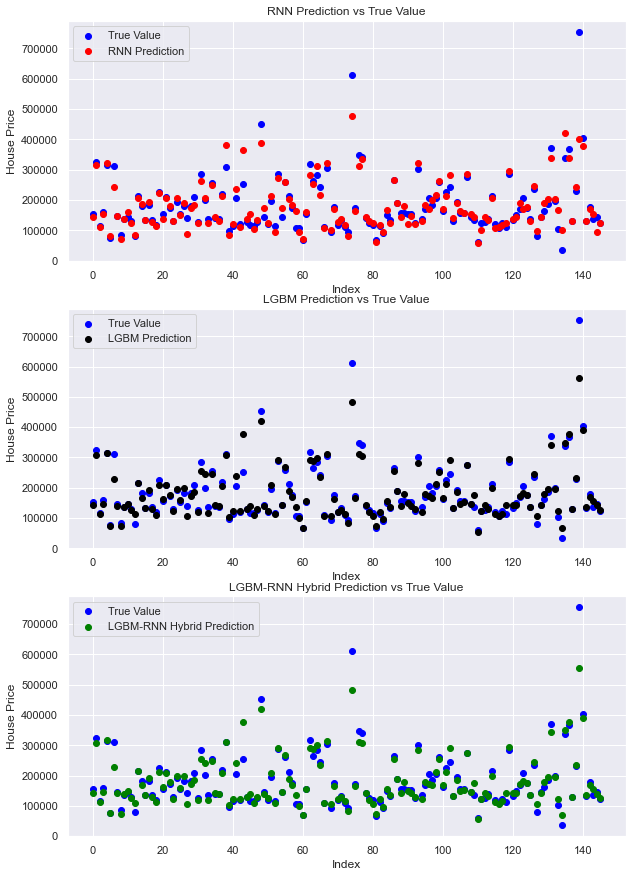

In [265]:
fig, ax = plt.subplots(3, figsize=(10,15))
ax[0].scatter(list(range(len(yTest))), yTest, color='blue')
ax[0].scatter(list(range(len(yTest))), yPred, color='Red')
ax[0].set_title('RNN Prediction vs True Value')
ax[0].set_xlabel('Index')
ax[0].set_ylabel('House Price')
ax[0].legend(['True Value', 'RNN Prediction'])
ax[1].scatter(list(range(len(yTest))), yTest, color='blue')
ax[1].scatter(list(range(len(yTest))),y_pred , color='Black')
ax[1].set_title('LGBM Prediction vs True Value')
ax[1].set_xlabel('Index')
ax[1].set_ylabel('House Price')
ax[1].legend(['True Value', 'LGBM Prediction'])
ax[2].scatter(list(range(len(yTest))), yTest, color='blue')
ax[2].scatter(list(range(len(yTest))),hybridPreds , color='green')
ax[2].set_title('LGBM-RNN Hybrid Prediction vs True Value')
ax[2].set_xlabel('Index')
ax[2].set_ylabel('House Price')
ax[2].legend(['True Value', 'LGBM-RNN Hybrid Prediction'])
plt.savefig('/Users/Documents/ECU/dataminingexperimentscatter.png')
plt.show()